# In this project we are supposed yo predict the sentiment of a given text, and predict if the text is positive , negative or neural in nature

## Importing Necessary Libraries-

In [1]:
import pandas as pd
import numpy as np
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from matplotlib import rcParams
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
import re
import nltk
import string
import collections
import contractions
from collections import Counter
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud, STOPWORDS
from nltk.tokenize import word_tokenize,sent_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem import PorterStemmer, LancasterStemmer, SnowballStemmer
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('punkt_tab')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\tuhin\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\tuhin\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\tuhin\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\tuhin\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [3]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# Loading data

In [4]:
with open("D:\\Sentiment Project\\TextAnalytics.txt",'r') as f:
    text = f.read()

In [5]:
# Data look like-
text

'0,"One of the other reviewers has mentioned that after watching just 1 Oz episode you\'ll be hooked. They are right, as this is exactly what happened with me.<br /><br />The first thing that struck me about Oz was its brutality and unflinching scenes of violence, which set in right from the word GO. Trust me, this is not a show for the faint hearted or timid. This show pulls no punches with regards to drugs, sex or violence. Its is hardcore, in the classic use of the word.<br /><br />It is called OZ as that is the nickname given to the Oswald Maximum Security State Penitentary. It focuses mainly on Emerald City, an experimental section of the prison where all the cells have glass fronts and face inwards, so privacy is not high on the agenda. Em City is home to many..Aryans, Muslims, gangstas, Latinos, Christians, Italians, Irish and more....so scuffles, death stares, dodgy dealings and shady agreements are never far away.<br /><br />I would say the main appeal of the show is due to th

# Text Normalization-

In [6]:
# Splitting at (\n):

text=text.split('\n')

In [7]:
# splitting at ( \t ).
corpus = [text]
for sent in text:
    corpus.append(sent.split('\t'))

In [8]:
# Taking only letters-
letters_only = re.sub(r'[^a-zA-Z]',
                          " ",
                          str(corpus))

## Tokenization-

In [9]:
# converting to lowercase.
letters_only=letters_only.lower()

token=nltk.sent_tokenize(letters_only)
token

['      one of the other reviewers has mentioned that after watching just   oz episode you  ll be hooked  they are right  as this is exactly what happened with me  br    br   the first thing that struck me about oz was its brutality and unflinching scenes of violence  which set in right from the word go  trust me  this is not a show for the faint hearted or timid  this show pulls no punches with regards to drugs  sex or violence  its is hardcore  in the classic use of the word  br    br   it is called oz as that is the nickname given to the oswald maximum security state penitentary  it focuses mainly on emerald city  an experimental section of the prison where all the cells have glass fronts and face inwards  so privacy is not high on the agenda  em city is home to many  aryans  muslims  gangstas  latinos  christians  italians  irish and more    so scuffles  death stares  dodgy dealings and shady agreements are never far away  br    br   i would say the main appeal of the show is due t

## Alphanumeric characters-

In [10]:
import contractions
import string

def contraction_remove(text):
    # Ensure 'token' is defined before running this cell.
    # w_tokenization is now defined in this cell.
    return contractions.fix(text)

def w_tokenization(text):
    text = text.lower()
    text = contraction_remove(text)
    tokens = nltk.word_tokenize(text)
    return tokens

def num_dec_al(word):
    if word.isnumeric():
        return 'xxxxxx'
    elif word.isdecimal():
        return 'xxx...'
    elif word.isalpha():
        return word
    else:
        return 'xxxaaa'

def clean_nda(sentence_text):
    # Ensure 'token'  is defined before running this cell.
    # w_tokenization is now defined in this cell.
    tokens = w_tokenization(sentence_text)
    map_list = list(map(num_dec_al, tokens))
    return " ".join(map_list)

# The global 'token' variable (list of sentences) needs to be defined from cell iwL9C2sJEKPt
# before this line can be executed successfully.
if 'token' in locals() or 'token' in globals():
    corpus_nda = list(map(clean_nda, token))
    print(corpus_nda)
else:
    print("Warning: 'token' variable not defined. Please run cell iwL9C2sJEKPt first.")
# Alpha numeric characters and decimals have been replaced with characters

['one of the other reviewers has mentioned that after watching just oz episode you ll be hooked they are right as this is exactly what happened with me br br the first thing that struck me about oz was its brutality and unflinching scenes of violence which set in right from the word go trust me this is not a show for the faint hearted or timid this show pulls no punches with regards to drugs sex or violence its is hardcore in the classic use of the word br br it is called oz as that is the nickname given to the oswald maximum security state penitentary it focuses mainly on emerald city an experimental section of the prison where all the cells have glass fronts and face inwards so privacy is not high on the agenda them city is home to many aryans muslims gangstas latinos christians italians irish and more so scuffles death stares dodgy dealings and shady agreements are never far away br br i would say the main appeal of the show is due to the fact that it goes where other shows wouldn t

## Removing Contractions.
It is a process where words like isn't, didn't are expanded to is not did not.
isn't --> is not,
I'm --> I am,
they're --> they are,
shouldn't --> should not,
can't --> can not

In [11]:
def contraction_remove(corpus_nda):
    corpus_nda = contractions.fix(corpus_nda)
    return corpus_nda

special = string.punctuation
def w_tokenization(corpus_nda):

  # convert into lower case
  corpus_nda = corpus_nda.lower()

  # contraction-
  corpus_nda = contraction_remove(corpus_nda)

  # Word tokens-
  tokens = nltk.word_tokenize(corpus_nda)

In [12]:
def contraction_remove(corpus_nda):
  # Use contractions.fix() to expand contractions directly
  return contractions.fix(corpus_nda)

special = string.punctuation
def w_tokenization(corpus_nda):
  # convert into lower case
  corpus_nda = corpus_nda.lower()
  # contraction
  corpus_nda = contraction_remove(corpus_nda)
  tokens = nltk.word_tokenize(corpus_nda) # word tokens
  return tokens
#contractions have been expanded and the letters have been converted to lowercase.

In [13]:
corpus_nda

['one of the other reviewers has mentioned that after watching just oz episode you ll be hooked they are right as this is exactly what happened with me br br the first thing that struck me about oz was its brutality and unflinching scenes of violence which set in right from the word go trust me this is not a show for the faint hearted or timid this show pulls no punches with regards to drugs sex or violence its is hardcore in the classic use of the word br br it is called oz as that is the nickname given to the oswald maximum security state penitentary it focuses mainly on emerald city an experimental section of the prison where all the cells have glass fronts and face inwards so privacy is not high on the agenda them city is home to many aryans muslims gangstas latinos christians italians irish and more so scuffles death stares dodgy dealings and shady agreements are never far away br br i would say the main appeal of the show is due to the fact that it goes where other shows wouldn t

In [14]:
# Separating at tab
data = [corpus_nda]
for sent in text:
    data.append(sent.split('\t'))

In [15]:
# Separating at newline-
data.append(sent.split('\n'))


In [16]:
# Cleaning text-

data

[['one of the other reviewers has mentioned that after watching just oz episode you ll be hooked they are right as this is exactly what happened with me br br the first thing that struck me about oz was its brutality and unflinching scenes of violence which set in right from the word go trust me this is not a show for the faint hearted or timid this show pulls no punches with regards to drugs sex or violence its is hardcore in the classic use of the word br br it is called oz as that is the nickname given to the oswald maximum security state penitentary it focuses mainly on emerald city an experimental section of the prison where all the cells have glass fronts and face inwards so privacy is not high on the agenda them city is home to many aryans muslims gangstas latinos christians italians irish and more so scuffles death stares dodgy dealings and shady agreements are never far away br br i would say the main appeal of the show is due to the fact that it goes where other shows wouldn 

In [17]:
# Saving the data into a dataframe.

df = pd.DataFrame(data)

In [18]:
df

,0,1,2,3,4,5,6
0,one of the other reviewers has mentioned that ...,NaN,NaN,NaN,NaN,NaN,NaN
1,"0,""One of the other reviewers has mentioned th...",NaN,NaN,NaN,NaN,NaN,NaN
2,"1,""A wonderful little production. <br /><br />...",NaN,NaN,NaN,NaN,NaN,NaN
3,"2,""I thought this was a wonderful way to spend...",NaN,NaN,NaN,NaN,NaN,NaN
4,"3,""Basically there's a family where a little b...",NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
997,"996,""I hated it. I hate self-aware pretentious...",NaN,NaN,NaN,NaN,NaN,NaN
998,"997,""I usually try to be professional and cons...",NaN,NaN,NaN,NaN,NaN,NaN
999,"998,""If you like me is going to see this in a ...",NaN,NaN,NaN,NaN,NaN,NaN
1000,"999,""This is like a zoology textbook, given th...",NaN,NaN,NaN,NaN,NaN,NaN


In [19]:
# dropping unnecessary columns.
df.drop([1,2,3,4,5,6],axis=1,inplace=True)

In [20]:
# Resulting dataframe-
df

,0
0,one of the other reviewers has mentioned that ...
1,"0,""One of the other reviewers has mentioned th..."
2,"1,""A wonderful little production. <br /><br />..."
3,"2,""I thought this was a wonderful way to spend..."
4,"3,""Basically there's a family where a little b..."
...,...
997,"996,""I hated it. I hate self-aware pretentious..."
998,"997,""I usually try to be professional and cons..."
999,"998,""If you like me is going to see this in a ..."
1000,"999,""This is like a zoology textbook, given th..."


In [21]:
# Renaming the column 0 as 'Text'
df= df.rename(columns={0: 'Text'})

# Final Dataset-

In [22]:
df

,Text
0,one of the other reviewers has mentioned that ...
1,"0,""One of the other reviewers has mentioned th..."
2,"1,""A wonderful little production. <br /><br />..."
3,"2,""I thought this was a wonderful way to spend..."
4,"3,""Basically there's a family where a little b..."
...,...
997,"996,""I hated it. I hate self-aware pretentious..."
998,"997,""I usually try to be professional and cons..."
999,"998,""If you like me is going to see this in a ..."
1000,"999,""This is like a zoology textbook, given th..."


# Row 0, 1 and 1000 and 1001 have repeated hence needs to be cleaned-

In [23]:
# Row 1 has repeated so it is dropped-
df.drop(df.index[:1], inplace = True)

In [24]:
# Row 1000 has repeated as well so it is dropped-
df.drop(df.index[1000:], inplace = True)

In [25]:
df

,Text
1,"0,""One of the other reviewers has mentioned th..."
2,"1,""A wonderful little production. <br /><br />..."
3,"2,""I thought this was a wonderful way to spend..."
4,"3,""Basically there's a family where a little b..."
5,"4,""Petter Mattei's """"Love in the Time of Money..."
...,...
996,"995,""Nothing is sacred. Just ask Ernie Fosseli..."
997,"996,""I hated it. I hate self-aware pretentious..."
998,"997,""I usually try to be professional and cons..."
999,"998,""If you like me is going to see this in a ..."


## Removing additional characters present in the dataframe-

In [26]:
# We can further see that there are still some special characters in the dataframe which have to be treated.

df.replace('\d+', '', regex=True, inplace=True)
df.replace(',', '', regex=True, inplace=True)
df.replace('br', '', regex=True, inplace=True)
df.replace('"', '', regex=True, inplace=True)
df.replace("'", '', regex=True, inplace=True)
df.replace('?', '', inplace=True)
df.replace("-", '', regex=True, inplace=True)
df.replace("*", '', inplace=True)
df.replace("***", '', inplace=True)
df.replace("< />", '', regex=True, inplace=True)

,Text
1,One of the other reviewers has mentioned that ...
2,A wonderful little production. The filming tec...
3,I thought this was a wonderful way to spend ti...
4,Basically theres a family where a little boy (...
5,Petter Matteis Love in the Time of Money is a ...
...,...
996,Nothing is sacred. Just ask Ernie Fosselius. T...
997,I hated it. I hate selfaware pretentious inani...
998,I usually try to be professional and construct...
999,If you like me is going to see this in a film ...


In [27]:
# Using the strip function in order to delete the special characters.

df['Text'] = df['Text'].str.strip('[')
df['Text'] = df['Text'].str.strip(']')
df['Text'] = df['Text'].str.strip('(')
df['Text'] = df['Text'].str.strip(')')

In [28]:
df

,Text
1,One of the other reviewers has mentioned that ...
2,A wonderful little production. The filming tec...
3,I thought this was a wonderful way to spend ti...
4,Basically theres a family where a little boy (...
5,Petter Matteis Love in the Time of Money is a ...
...,...
996,Nothing is sacred. Just ask Ernie Fosselius. T...
997,I hated it. I hate selfaware pretentious inani...
998,I usually try to be professional and construct...
999,If you like me is going to see this in a film ...


## Lemmatization of the text column-

In [29]:
# The following line is commented out as 'df' is not defined at this point.
# This operation should be performed after 'df' has been properly created and cleaned.
# df['Text'] = df['Text'].apply(lemmatization_sentence)

def lemmatization_sentence(sentence):
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(sentence)
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in tokens]
    return ' '.join(lemmatized_tokens)

In [30]:
Text = df['Text']

In [31]:
# As_matrix() function is used to convert the given series or dataframe object to Numpy-array representation.

token = Text.to_numpy()

In [32]:
# Sentence tokenization-

token = nltk.sent_tokenize(str(token))

In [33]:
# Saving token on form of array-

data = np.array(token)

In [34]:
# Saving stopwords in stop-

stop = stopwords.words('english')

## Removing stopwords from the dataframe.

In [35]:
# Removing stopwords from the text and printing the words without stopwords

text = data
text_tokens = word_tokenize(str(text))

tokens_without_sw = [word for word in text_tokens if not word in stop]

print(tokens_without_sw)

['[', '``', '[', "'", 'One', 'reviewers', 'mentioned', 'watching', 'Oz', 'episode', 'youll', 'hooked', '.', "''", "'", 'They', 'right', 'exactly', 'happened', 'me.The', 'first', 'thing', 'struck', 'Oz', 'utality', 'unflinching', 'scenes', 'violence', 'set', 'right', 'word', 'GO', '.', "'", "'", 'Trust', 'show', 'faint', 'hearted', 'timid', '.', "'", '...', "'", 'Any', 'time', 'youre', 'hunted', 'giant', 'creatures', 'great', 'time', 'hit', 'girls', 'half', 'age', '.', "'", "'", 'Animal', 'noises', 'appropriate', 'masking', 'noise', 'swearing', 'volume', '.', "'", '``', 'Old', 'Israeli', 'Russian', 'planes', 'regularly', 'used', 'US', 'Military', '.', "'", ']', "''", ']']


# Visualization-

In [36]:
# Removing stopwords for wordcloud visualization

stopwords = set(stopwords.words("english"))

In [37]:
wordcloud = WordCloud(stopwords=stop, background_color="white", max_words=1000).generate(str(tokens_without_sw))
## WordCloud is a technique to show which words are the most frequent among the given text

## Visualizing the highest repeating words in the dataframe using the wordcloud-

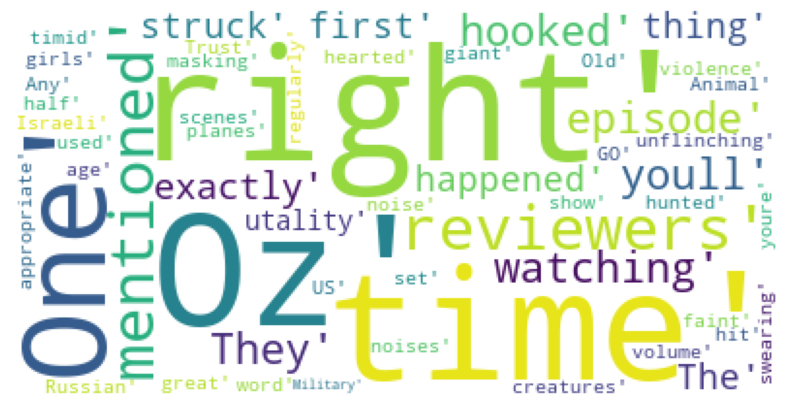

In [38]:
rcParams['figure.figsize'] = 10, 20
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

## Counting the numbers of times a eord has repeated through out the data.

In [39]:
tokens_without_sw = (str(tokens_without_sw))

In [40]:
# Removing stopwords as creating two lists to display the words and their counts
filtered_words = [word for word in tokens_without_sw.split() if word not in stopwords]
counted_words = collections.Counter(filtered_words)

words = []
counts = []
for letter, count in counted_words.most_common(10):
    words.append(letter)
    counts.append(count)


In [41]:
counted_words.most_common(100) # the word 'movie' has repeated for 2081 times.

[('"\'",', 10),
 ("'.',", 6),
 ("'``',", 2),
 ("'Oz',", 2),
 ('"\'\'",', 2),
 ("'right',", 2),
 ("'time',", 2),
 ("['[',", 1),
 ("'[',", 1),
 ("'One',", 1),
 ("'reviewers',", 1),
 ("'mentioned',", 1),
 ("'watching',", 1),
 ("'episode',", 1),
 ("'youll',", 1),
 ("'hooked',", 1),
 ("'They',", 1),
 ("'exactly',", 1),
 ("'happened',", 1),
 ("'me.The',", 1),
 ("'first',", 1),
 ("'thing',", 1),
 ("'struck',", 1),
 ("'utality',", 1),
 ("'unflinching',", 1),
 ("'scenes',", 1),
 ("'violence',", 1),
 ("'set',", 1),
 ("'word',", 1),
 ("'GO',", 1),
 ("'Trust',", 1),
 ("'show',", 1),
 ("'faint',", 1),
 ("'hearted',", 1),
 ("'timid',", 1),
 ("'...',", 1),
 ("'Any',", 1),
 ("'youre',", 1),
 ("'hunted',", 1),
 ("'giant',", 1),
 ("'creatures',", 1),
 ("'great',", 1),
 ("'hit',", 1),
 ("'girls',", 1),
 ("'half',", 1),
 ("'age',", 1),
 ("'Animal',", 1),
 ("'noises',", 1),
 ("'appropriate',", 1),
 ("'masking',", 1),
 ("'noise',", 1),
 ("'swearing',", 1),
 ("'volume',", 1),
 ("'Old',", 1),
 ("'Israeli',", 

## Visualizing top 10 repeated/common words using bag graph.


<BarContainer object of 10 artists>

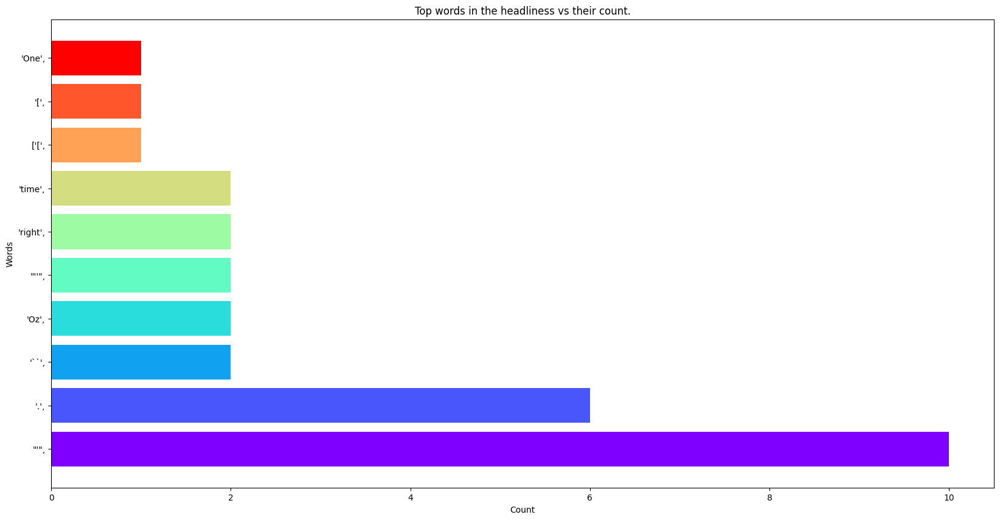

In [42]:
colors = cm.rainbow(np.linspace(0, 1, 10))
rcParams['figure.figsize'] = 20, 10

plt.title('Top words in the headliness vs their count.')
plt.xlabel('Count')
plt.ylabel('Words')
plt.barh(words, counts, color=colors)

# Sentiment Analysis-

## Vader sentiment analysis is done in order to find if a given (Word) is positive, negative or  neutral in nature.

In [43]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
sentence = tokens_without_sw
tokenized_sentence = nltk.word_tokenize(sentence)

sid = SentimentIntensityAnalyzer()
pos_word_list=[]
neu_word_list=[]
neg_word_list=[]

for word in tokenized_sentence:
    if (sid.polarity_scores(word)['compound']) >= 0.1:
        pos_word_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.1:
        neg_word_list.append(word)
    else:
        neu_word_list.append(word)

print('Positive:',pos_word_list)
print('Neutral:',neu_word_list)
print('Negative:',neg_word_list)
score = sid.polarity_scores(sentence)
print('\nScores:', score)

Positive: ['Trust', 'great']
Neutral: ['[', "'", '[', "'", ',', "'", '``', "'", ',', "'", '[', "'", ',', '``', "'", "''", ',', "'", 'One', "'", ',', "'", 'reviewers', "'", ',', "'", 'mentioned', "'", ',', "'", 'watching', "'", ',', "'", 'Oz', "'", ',', "'", 'episode', "'", ',', "'", 'youll', "'", ',', "'", 'hooked', "'", ',', "'", '.', "'", ',', '``', "''", "''", ',', '``', "'", "''", ',', "'", 'They', "'", ',', "'", 'right', "'", ',', "'", 'exactly', "'", ',', "'", 'happened', "'", ',', "'", 'me.The', "'", ',', "'", 'first', "'", ',', "'", 'thing', "'", ',', "'", "'", ',', "'", 'Oz', "'", ',', "'", 'utality', "'", ',', "'", 'unflinching', "'", ',', "'", 'scenes', "'", ',', "'", "'", ',', "'", 'set', "'", ',', "'", 'right', "'", ',', "'", 'word', "'", ',', "'", 'GO', "'", ',', "'", '.', "'", ',', '``', "'", "''", ',', '``', "'", "''", ',', "'", "'", ',', "'", 'show', "'", ',', "'", 'faint', "'", ',', "'", 'hearted', "'", ',', "'", "'", ',', "'", '.', "'", ',', '``', "'", "''", ',', "'"

In [44]:
pos_word_list[:100]
neg_word_list[:100]

['struck', 'violence', 'timid', 'swearing']

## Top 100 Positive words-

In [45]:
# These are the top 100 positive words found in the dataset.

print(list(iter(pos_word_list[:100])))

['Trust', 'great']


## Top 100 Negative words-

In [46]:
# These are the top 100 negative words found in the dataset.

print(list(iter(neg_word_list[:100])))

['struck', 'violence', 'timid', 'swearing']


## Vader sentiment analysis for a given(Sentence) if positive, negative or neutral in nature.

In [47]:
sid = SentimentIntensityAnalyzer()
for sentence in Text:
  print(sentence)

  ss = sid.polarity_scores(sentence)
  for k in ss:
    print('{0}: {1}, '.format(k, ss[k]), end='')
  print()

One of the other reviewers has mentioned that after watching just  Oz episode youll be hooked. They are right as this is exactly what happened with me.The first thing that struck me about Oz was its utality and unflinching scenes of violence which set in right from the word GO. Trust me this is not a show for the faint hearted or timid. This show pulls no punches with regards to drugs sex or violence. Its is hardcore in the classic use of the word.It is called OZ as that is the nickname given to the Oswald Maximum Security State Penitentary. It focuses mainly on Emerald City an experimental section of the prison where all the cells have glass fronts and face inwards so privacy is not high on the agenda. Em City is home to many..Aryans Muslims gangstas Latinos Christians Italians Irish and more....so scuffles death stares dodgy dealings and shady agreements are never far away.I would say the main appeal of the show is due to the fact that it goes where other shows wouldnt dare. Forget p

## Converting all Polarity scores and sentences into a dataframe-

In [48]:
# Creating a dataframe.

analyzer = SentimentIntensityAnalyzer()
df['rating'] = Text.apply(analyzer.polarity_scores)
df=pd.concat([df.drop(['rating'], axis=1), df['rating'].apply(pd.Series)], axis=1)

In [49]:
df.head()

,Text,neg,neu,pos,compound
1,One of the other reviewers has mentioned that ...,0.176,0.758,0.066,-0.9907
2,A wonderful little production. The filming tec...,0.053,0.765,0.182,0.9670
3,I thought this was a wonderful way to spend ti...,0.116,0.675,0.210,0.9579
4,Basically theres a family where a little boy (...,0.130,0.808,0.062,-0.9213
5,Petter Matteis Love in the Time of Money is a ...,0.052,0.800,0.148,0.9744


## Arranging the dataset in descending order based on (Compound score) to find the most important sentence from the given data.

In [50]:
# arranging the compound column in descending order to find the best sentence.

imp_sent=df.sort_values(by='compound', ascending=False)

In [51]:
imp_sent

,Text,neg,neu,pos,compound
411,I firmly believe that the best Oscar ceremony ...,0.087,0.621,0.292,0.9996
567,Few would argue that master animation director...,0.042,0.743,0.215,0.9995
364,The plot: Michael Linnett Connors has done eve...,0.018,0.816,0.166,0.9992
211,I have just given a for Thieves Highway I men...,0.094,0.637,0.269,0.9992
944,A film for mature educated audiences...I saw R...,0.073,0.678,0.249,0.9990
...,...,...,...,...,...
354,This film held my interest enough to watch it ...,0.193,0.702,0.105,-0.9981
247,This show makes absolutely no sense. Every wee...,0.332,0.617,0.052,-0.9982
323,If only I had read the review by Alex Sander (...,0.197,0.713,0.089,-0.9983
766,This film cant make up its mind whether its me...,0.255,0.649,0.096,-0.9988


In [52]:
# Sentence with index 410 has the highest compound score
# and hence it is the most important sentence among all the sentences.

print(df['Text'].iloc[410] )

I firmly believe that the best Oscar ceremony in recent years was in  for two reasons:  ) Host Steve Martin was at his most wittiest:  I saw the teamsters help Michael Moore into the trunk of his limo  and  Ill better not mention the gay mafia in case I wake up with a poodles head in my bed   ) Surprise winners: No one had Adrien Brody down for best actor ( Genuine applause ) or Roman Polanski for best director ( Genuine jeers and boos ) but they won Last years award ceremony wasnt too bad but there was little in the way of surprises and I was happy to see RETURN OF THE KING sweep the awards even if it wasnt the best in the trilogy ( FELLOWSHIP was much better )but what let the BBC coverage down was Jonathan Ross getting a few of his sycophantic mates round and pretending they were hilarious when they were anything but . So when I heard Sky were doing the coverage for British TV I was expecting Barry Norman and Mark Kermode to be doing the links  but instead we ended up with Jamie Thea

## Finding top positive sentence in the data-

In [53]:
# Arranging the dataframe by positive column in descending order to find the best postive sentence.

pos_sent=df.sort_values(by='pos', ascending=False)

In [54]:
pos_sent

,Text,neg,neu,pos,compound
161,MYSTERY MEN has got to be THE stupidest film I...,0.099,0.446,0.455,0.9896
10,If you like original gut wrenching laughter yo...,0.098,0.511,0.391,0.9149
322,I have watched this movie countless times and ...,0.000,0.662,0.338,0.9836
382,This film was pretty good. I am not too big a ...,0.035,0.627,0.338,0.9944
598,In short if you want to watch Burt Reynolds be...,0.040,0.626,0.334,0.9970
...,...,...,...,...,...
943,If somebody wants to make a really REALLY bad ...,0.159,0.841,0.000,-0.9565
756,A wellmade runofthemill movie with a tragic en...,0.128,0.872,0.000,-0.8402
340,I find the critique of many IMDb users a littl...,0.130,0.870,0.000,-0.9653
836,The story has been told before. A deadly disea...,0.056,0.944,0.000,-0.4497


In [55]:
 # Sentence with index 160 has the highest positive score and is the most postive.

print(df['Text'].iloc[160] )

MYSTERY MEN has got to be THE stupidest film Ive ever seen but what a film! I thought it was fabulous excellent and impressive. It was funny welldone and nice to see ridiculous Super Heroes for a change! And being able to pull it off! This was great! Ill definitely watch it again!


## Finding top negative sentence in the data-

In [56]:
# Arranging the dataframe by negative column in descending order to find the best negative sentence.

neg_sent=df.sort_values(by='neg', ascending=False)

In [57]:
neg_sent

,Text,neg,neu,pos,compound
414,A rating of does not begin to express how dul...,0.386,0.614,0.000,-0.8316
737,Baba Rajinikanth will never forget this name ...,0.343,0.629,0.027,-0.9954
247,This show makes absolutely no sense. Every wee...,0.332,0.617,0.052,-0.9982
282,After a very scary crude opening which gives y...,0.325,0.614,0.061,-0.9894
98,Well I like to watch bad horror BMovies cause ...,0.318,0.561,0.121,-0.9907
...,...,...,...,...,...
426,If you like SciFi Monsters and Ancient Legends...,0.000,0.763,0.237,0.9772
470,Although the plot of this film is a bit farfet...,0.000,0.724,0.276,0.9545
448,i am finally seeing the El Padrino movie from ...,0.000,0.772,0.228,0.9896
962,I agree with BigAlC this movie actually prepa...,0.000,0.790,0.210,0.9850


In [58]:
# sentence with index 413 has the highest negative score and is the most negative sentence

print(df['Text'].iloc[413] )

A rating of  does not begin to express how dull depressing and relentlessly bad this movie is.


In [59]:
sentences=df

# Given threshold values to classify if a given sentence is positive, negative or

In [60]:
#Assigning score categories and logic
i = 0

predicted_value = [ ] #empty series to hold our predicted values

while(i<len(sentences)):
    if ((sentences.iloc[i]['compound'] >= 0.5)):
        predicted_value.append('positive')
        i = i+1
    elif ((sentences.iloc[i]['compound'] > 0) & (sentences.iloc[i]['compound'] < 0.5)):
        predicted_value.append('neutral')
        i = i+1
    elif ((sentences.iloc[i]['compound'] <= 0)):
        predicted_value.append('negative')
        i = i+1
# The threshold value will categorize if a given sentence is positive negative or neutral in nature.

In [61]:
predicted_value

['negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'positive',
 'positive',
 'neutral',
 'neutral',
 'positive',
 'positive',
 'positive',
 'positive',
 'neutral',
 'negative',
 'negative',
 'neutral',
 'negative',
 'positive',
 'positive',
 'positive',
 'negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'positive',
 'negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'neutral',
 'positive',
 'negative',
 'positive',
 'positive',
 'positive',
 'positive',
 'negative',
 'positive',
 'neutral',
 'positive',
 'positive',
 'negative',
 'positive',
 'negative',
 'negative',
 'negative',
 'positive',
 'negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'negative',
 'neutral',
 'negative',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'neutral',
 'positive',
 'positive',
 'positive',
 'negative',
 'negat

## Adding the target or sentiment column to our data frame.

In [62]:
# A new column has been created called as 'Target' with sentiments assigned to a given text.

df['Target'] = predicted_value

In [63]:
df.head()

,Text,neg,neu,pos,compound,Target
1,One of the other reviewers has mentioned that ...,0.176,0.758,0.066,-0.9907,negative
2,A wonderful little production. The filming tec...,0.053,0.765,0.182,0.9670,positive
3,I thought this was a wonderful way to spend ti...,0.116,0.675,0.210,0.9579,positive
4,Basically theres a family where a little boy (...,0.130,0.808,0.062,-0.9213,negative
5,Petter Matteis Love in the Time of Money is a ...,0.052,0.800,0.148,0.9744,positive


## Removing/dropping the 'neg', 'neu', 'pos' and 'compound' columns.

In [64]:
# Dropping the neg, neu, pos, and compound columns.

df.drop(['neg', 'neu', 'pos', 'compound'], axis=1, inplace=True)

In [65]:
# Final dataframe with sentiments.

df

,Text,Target
1,One of the other reviewers has mentioned that ...,negative
2,A wonderful little production. The filming tec...,positive
3,I thought this was a wonderful way to spend ti...,positive
4,Basically theres a family where a little boy (...,negative
5,Petter Matteis Love in the Time of Money is a ...,positive
...,...,...
996,Nothing is sacred. Just ask Ernie Fosselius. T...,neutral
997,I hated it. I hate selfaware pretentious inani...,negative
998,I usually try to be professional and construct...,negative
999,If you like me is going to see this in a film ...,negative


In [66]:
# There are 577 positive, 363 negative and 60 neutral columns present in the dataset.

df['Target'].value_counts()

Target
positive    577
negative    363
neutral      60
Name: count, dtype: int64

In [67]:
# Label Encoding the target column.

cat_cols = ['Target']
le = LabelEncoder()
for i in cat_cols:
  df[i] = le.fit_transform(df[i])
df.dtypes

Text        str
Target    int64
dtype: object

In [68]:
# Label encoded value_counts()

df['Target'].value_counts()

Target
2    577
0    363
1     60
Name: count, dtype: int64

In [69]:
df

,Text,Target
1,One of the other reviewers has mentioned that ...,0
2,A wonderful little production. The filming tec...,2
3,I thought this was a wonderful way to spend ti...,2
4,Basically theres a family where a little boy (...,0
5,Petter Matteis Love in the Time of Money is a ...,2
...,...,...
996,Nothing is sacred. Just ask Ernie Fosselius. T...,1
997,I hated it. I hate selfaware pretentious inani...,0
998,I usually try to be professional and construct...,0
999,If you like me is going to see this in a film ...,0


In [70]:
# Vectorizing training data.

tfidf = TfidfVectorizer()
X = tfidf.fit_transform(df['Text'])
Y = df['Target']

# Applying Tf-Idfn vectorizer on the Text column.

In [71]:
# Splitting the dataset.

X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2,random_state=40)
print(X_train.shape,X_test.shape,Y_train.shape,Y_test.shape)

(800, 19123) (200, 19123) (800,) (200,)


# Logistic Regression-

In [72]:
log_reg = LogisticRegression().fit(X_train, Y_train)

# Predict on trin-
train_preds = log_reg.predict(X_train)

# Accuracy on train-
print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds))

# Predict on test-
test_preds = log_reg.predict(X_test)

# Accuracy on test-
print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds))

Model accuracy on train is:  0.9225
Model accuracy on test is:  0.635


In [73]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn import metrics
from sklearn.metrics import accuracy_score, auc, confusion_matrix, roc_auc_score, roc_curve, recall_score

# Decision Tree Classifics-

In [74]:
DT = DecisionTreeClassifier().fit(X, Y)

In [75]:
# Predict on train
train_preds2 = DT.predict(X_train)
# Accuracy on train
print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds2))

# Predict on test
test_preds2 = DT.predict(X_test)
# Accuracy on test
print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds2))
print('-'*50)

# Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(Y_train, train_preds2))
print("confusion_matrix test is: ", confusion_matrix(Y_test, test_preds2))
print('Wrong predictions out of total')
print('-'*50)

# Wrong Predictions made.
print((Y_test !=test_preds2).sum(),'/',((Y_test == test_preds2).sum()+(Y_test != test_preds2).sum()))
print('-'*50)

# Kappa Score
print('KappaScore is: ', metrics.cohen_kappa_score(Y_test,test_preds2))

Model accuracy on train is:  1.0
Model accuracy on test is:  1.0
--------------------------------------------------
confusion_matrix train is:  [[283   0   0]
 [  0  47   0]
 [  0   0 470]]
confusion_matrix test is:  [[ 80   0   0]
 [  0  13   0]
 [  0   0 107]]
Wrong predictions out of total
--------------------------------------------------
0 / 200
--------------------------------------------------
KappaScore is:  1.0


In [76]:
# Fit the model on train data
RF = RandomForestClassifier().fit(X_train,Y_train)
# Predict on train
train_preds3 = RF.predict(X_train)
# Accuracy on train
print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds3))

# Predict on test
test_preds3 = RF.predict(X_test)
# Accuracy on test
print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds3))
print('-'*50)

# Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(Y_train, train_preds3))
print("confusion_matrix test is: ", confusion_matrix(Y_test, test_preds3))
print('Wrong predictions out of total')
print('-'*50)

# Wrong Predictions made.
print((Y_test !=test_preds3).sum(),'/',((Y_test == test_preds3).sum()+(Y_test != test_preds3).sum()))
print('-'*50)

Model accuracy on train is:  1.0
Model accuracy on test is:  0.6
--------------------------------------------------
confusion_matrix train is:  [[283   0   0]
 [  0  47   0]
 [  0   0 470]]
confusion_matrix test is:  [[ 16   0  64]
 [  1   0  12]
 [  3   0 104]]
Wrong predictions out of total
--------------------------------------------------
80 / 200
--------------------------------------------------


In [77]:
# Fit the model on train data
KNN = KNeighborsClassifier().fit(X_train,Y_train)
# Predict on train
train_preds4 = KNN.predict(X_train)
# Accuracy on train
print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds4))

# predict on test
test_preds4 = KNN.predict(X_test)
# Accuracy on test
print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds4))
print('-'*50)

# Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(Y_train, train_preds4))
print("confusion_matrix test is: ", confusion_matrix(Y_test, test_preds4))
print('Wrong predictions out of total')
print('-'*50)

# Wrong Predictions made.
print((Y_test !=test_preds4).sum(),'/',((Y_test == test_preds4).sum()+(Y_test != test_preds4).sum()))
print('-'*50)

Model accuracy on train is:  0.725
Model accuracy on test is:  0.53
--------------------------------------------------
confusion_matrix train is:  [[124   0 159]
 [ 18   0  29]
 [ 14   0 456]]
confusion_matrix test is:  [[11  0 69]
 [ 2  0 11]
 [12  0 95]]
Wrong predictions out of total
--------------------------------------------------
94 / 200
--------------------------------------------------


# Support Vector Machine-

In [78]:
# Fit the model on train data
SVM = SVC(kernel='linear')
SVM.fit(X_train, Y_train)

# Predict on train
train_preds5 = SVM.predict(X_train)
# Accuracy on train
print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds5))

# Predict on test
test_preds5 = SVM.predict(X_test)
# Accuracy on test
print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds5))
print('-'*50)

# Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(Y_train, train_preds5))
print("confusion_matrix test is: ", confusion_matrix(Y_test, test_preds5))
print('Wrong predictions out of total')
print('-'*50)

# Wrong Predictions made.
print((Y_test !=test_preds5).sum(),'/',((Y_test == test_preds5).sum()+(Y_test != test_preds5).sum()))
print('-'*50)

Model accuracy on train is:  0.95625
Model accuracy on test is:  0.695
--------------------------------------------------
confusion_matrix train is:  [[277   0   6]
 [  5  18  24]
 [  0   0 470]]
confusion_matrix test is:  [[ 37   0  43]
 [  2   0  11]
 [  5   0 102]]
Wrong predictions out of total
--------------------------------------------------
61 / 200
--------------------------------------------------


In [79]:
import joblib

# Assuming 'log_reg' is your trained Logistic Regression model and 'tfidf' is your TfidfVectorizer
# You would typically save these after training.

# Save the Logistic Regression model
joblib.dump(log_reg, 'logistic_regression_model.pkl')
print("Logistic Regression model saved as logistic_regression_model.pkl")

# Save the TF-IDF vectorizer
joblib.dump(tfidf, 'tfidf_vectorizer.pkl')
print("TF-IDF vectorizer saved as tfidf_vectorizer.pkl")

Logistic Regression model saved as logistic_regression_model.pkl
TF-IDF vectorizer saved as tfidf_vectorizer.pkl


### Basic Flask API for Local Testing

This code block sets up a minimal Flask API. To run it, you'll need to install Flask. After running the cell, you might see a warning about running a server in Colab. This is for local testing and demonstration. For actual deployment, you would typically use a cloud platform.

In [4]:
from flask import Flask, request, jsonify
import joblib
import pandas as pd

# Load the trained model and vectorizer
loaded_model = joblib.load('logistic_regression_model.pkl')
loaded_tfidf = joblib.load('tfidf_vectorizer.pkl')

app = Flask(__name__)

@app.route('/')
def home():
    return jsonify({
        'message': 'Sentiment analysis API is running.',
        'usage': 'POST to /predict with JSON body: {"text": "your text here"}'
    })

@app.route('/predict', methods=['POST'])
def predict():
    data = request.json  # Get data posted as JSON
    if not data:
        return jsonify({'error': 'No JSON body provided'}), 400

    text_to_predict = data.get('text', '')
    if not text_to_predict:
        return jsonify({'error': 'No text provided for prediction'}), 400

    try:
        vectorized_text = loaded_tfidf.transform([text_to_predict])
        prediction_label = loaded_model.predict(vectorized_text)[0]
        sentiment_map = {0: 'negative', 1: 'neutral', 2: 'positive'}
        predicted_sentiment = sentiment_map.get(prediction_label, 'unknown')
        return jsonify({'text': text_to_predict, 'predicted_sentiment': predicted_sentiment})
    except Exception as e:
        return jsonify({'error': str(e)}), 500

if __name__ == '__main__':
    app.run(host='0.0.0.0', port=5000, debug=False)

 * Serving Flask app '__main__'
 * Debug mode: off


 * Running on all addresses (0.0.0.0)
 * Running on http://127.0.0.1:5000
 * Running on http://172.70.102.177:5000
Press CTRL+C to quit
172.70.102.177 - - [07/Aug/2026 01:21:02] "GET / HTTP/1.1" 200 -
127.0.0.1 - - [07/Aug/2026 01:21:57] "GET / HTTP/1.1" 200 -


##